# 제주도 재난지원금 소비 분석

## 결론

    1. 월 평균 재난지원금 주요 사용업종은 일반 한식, 슈퍼마켓, 농축협으로 생활에 밀접한 업종들에서 재난지원금의 결제 빈도가 높으며, 그에 대한 소비도 높음을 확인할 수 있다.


    2. 월 평균 재난지원금 주요 사용업종을 묶어 확인해본 결과 일반 휴게음식, 유통업, 음료 식품, 연료 판매 등 일상생활에 밀접한 업종들에서 소비가 일어나는것을 확인할 수 있다.


    3. 총 매출 기준으로 확인해본 결과 재난지원금과 유사하게 생활밀착형 업종에서 사용되는것을 확인할 수 있다.


    4. 업종을 요약하여 확인해봤을때는 재난지원금의 소비 패턴과 유사하게 생활 밀착형 업종에서 소비가 활발하다.


    5. 영세 규모에 차이에 관계 없이 생활 밀착형 업종에서 소비가 활발하다고 할 수 있다.


    6. 코로나의 여파로 2020.05 ~ 2020.07 에 전반적 소비가 감소하였음을 확인할 수 있다.


    7. 시간대별로 파악해본 결과, 오후 12시와 18시에 소비가 활발하게 일어납니다.

    8. 제주도 제주시, 서귀포시 뿐만 아니라 해변 인근 관광지에 재난지원금이 사용된 업체들이 밀집해있음을 확인할 수 있다.


    9. Insight 8.에서 확인한 군집지역에서 재난지원금 소비가 활발히 발생함을 확인할 수 있다.


    10. 제주도 내 전통시장 영역의 '전체 제주도 소비 대비 전통시장 소비'를 비율로 확인한 결과 재난지원금이 제주도 내 전통시장의 소비 증진에 도움을 줬다.

### 참고 사이트

    1. 우편번호 형상정보: https://www.juso.go.kr/addrlink/addressBuildDevNew.do?menu=bsin

    2. 전통시장 주소정보: ttps://www.data.go.kr/data/15052837/fileData.do

    3. 지오코딩을 위한 다음 지도 api: https://apis.map.kakao.com/web/sample/addr2coord/

    4. 영세규모: http://web.innopay.co.kr/9979

    5-1. 참고 뉴스: https://www.yna.co.kr/view/GYH20200610002000044

    5-2. 참고 뉴스: http://www.safetimes.co.kr/news/articleView.html?idxno=82157

### 1. setup

In [1]:
## check R version
print(R.version)

#### 0. setup ---
library(utils)
packages= c("ggplot2", "data.table", "dplyr", "sf", 'geojsonio',
            'leaflet', 'fpc', 'gridExtra', 'grid', 'BAMMtools',
            'ggimage')

if ( sum(!(packages %in% rownames(utils::installed.packages()))) > 0 ) {
  unInstalled = packages[!packages %in% rownames(utils::installed.packages())]
  suppressMessages(invisible(lapply(unInstalled, install.packages) ))
}
suppressMessages(invisible(lapply(packages, library, character.only = TRUE)))

library(ggplot2); library(data.table); library(dplyr); library(geojsonio);
library(sf); library(fpc); library(grid); library(gridExtra); library(BAMMtools)
library(ggimage)

options(warn=-1)

## Connect to OPENDW
katech = "+proj=tmerc +lat_0=38 +lon_0=128 +k=0.9999 +x_0=400000 +y_0=600000 +ellps=bessel +towgs84=-115.8,474.99,674.11,1.16,-2.31,-1.63,6.43 +units=m +no_defs"
wgs84 = "+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs +towgs84=0,0,0"
utmk = "+proj=tmerc +lat_0=38 +lon_0=127.5 +k=0.9996 +x_0=1000000 +y_0=2000000 +ellps=GRS80 +units=m +no_defs"

## 내가 자주 쓰는 함수.
ul = function(vector) {
  return( length(unique(vector)) )
}

nl = function(vector) {
  return( sum(is.na(vector) ) )
}

nw = function(vector) {
  return( which(is.na(vector) ) )
}

len = function(vector) {
  return( length(vector) )
}

               _                           
platform       x86_64-w64-mingw32          
arch           x86_64                      
os             mingw32                     
system         x86_64, mingw32             
status                                     
major          3                           
minor          6.1                         
year           2019                        
month          07                          
day            05                          
svn rev        76782                       
language       R                           
version.string R version 3.6.1 (2019-07-05)
nickname       Action of the Toes          


Warning message:
"package 'sf' was built under R version 3.6.3"Warning message:
"package 'geojsonio' was built under R version 3.6.3"Warning message:
"package 'leaflet' was built under R version 3.6.3"Warning message:
"package 'fpc' was built under R version 3.6.3"Warning message:
"package 'gridExtra' was built under R version 3.6.3"Warning message:
"package 'BAMMtools' was built under R version 3.6.3"Warning message:
"package 'ape' was built under R version 3.6.3"Warning message:
"package 'ggimage' was built under R version 3.6.3"

## 데이터가공
### 1. 데이터 원본 bind
### 2. 수작업 업종 분류 load
### 3. 우편번호 형상정보 load

In [2]:
# 데이터 원본 bind
data_path = "../data/원본/"
data_files = dir(data_path)
data_files = data_files[grepl("^KRI", data_files)]

nm = c("YM", "SIDO", "SIGUNGU", "FranClass", "Type", "Time", "TotalSpent", "DisSpent", "NumofSpent", "NumofDisSpent", "POINT_X", "POINT_Y")
data_bind = lapply(1:length(data_files), function(i) {
  d = fread( paste0(data_path, data_files[i]) , select = nm)
}) %>% do.call(rbind, .)

# 업종정보 
# 출처: 수작업 수행
sector = fread("../data/외부데이터/업종구분/업종분류.csv")

# 우편번호 형상정보 load
# 출처: "https://www.juso.go.kr/addrlink/addressBuildDevNew.do?menu=bsin"
# 제주도 형상정보 활용
bas = st_read("../data/외부데이터/우편번호/TL_KODIS_BAS_50.shp", crs = 5179)
bas_select = bas %>% dplyr::select(BAS_ID, geometry)

# 전통시장 지오코딩 및 buffer 형상화..
# https://www.data.go.kr/data/15052837/fileData.do

# 전통시장 지오코딩 수행
# 다음 api 샘플을 통해 수동으로 좌표변환 수행
# https://apis.map.kakao.com/web/sample/addr2coord/

jeju_market_ptr = fread("/home/niceguy1575/niceguy1575/dacon/data/전통시장/제주_전통시장.csv")
jeju_market_ptr = jeju_market_ptr[,c(5, 7, 8, 9, 10, 11, 12)]
names(jeju_market_ptr) = c("nm", "addr", "magnitude", "area", "shop_cnt", "x", "y")
jeju_market_ptr$area = as.numeric(gsub(",", "", jeju_market_ptr$area))

Reading layer `TL_KODIS_BAS_50' from data source `

ERROR: Error in CPL_read_ogr(dsn, layer, query, as.character(options), quiet, : '<ec><99><b8>遺<eb>뜲<ec>씠<ed>꽣\<ec>슦<ed>렪踰덊샇\TL_KODIS_BAS_50.shp'에서 유효하지 않은 멀티바이트 문자열이 있습니다


In [4]:
# 모든 데이터를 사전에 생산한 RData로 로드하였음을 밝힘.
load("../data/외부데이터/우편번호/TL_KODIS_BAS_50.RData")
load("../data/외부데이터/업종구분/sector.RData")
load("../data/외부데이터/전통시장/jeju_market_ptr.RData")
load("../data/원본/data_origin.RData")

## 1. 업종별로 소비에  차이가 존재하는가?

- 상위 업종의 매출 비율 확인

In [5]:
# 데이터 집계
data_filter = data_bind %>%
  dplyr::filter(TotalSpent >= 0 & DisSpent >= 0) %>%
  left_join(sector, by = 'Type')

data_smry = data_filter %>%
  group_by(YM, Type_Upper, Type) %>% 
  dplyr::summarise(
    TotalSpent = sum(as.numeric(TotalSpent), na.rm = TRUE),
    NumofSpent = sum(as.numeric(NumofSpent), na.rm = TRUE),
    DisSpent = sum(as.numeric(DisSpent), na.rm = TRUE),
    NumofDisSpent = sum(as.numeric(NumofDisSpent), na.rm = TRUE)
  )

data_smry_by_mon = data_smry %>%
  group_by(Type_Upper, Type) %>% 
  dplyr::summarise(
    total_spent = mean(TotalSpent), total_cnt = mean(NumofSpent),
    total_disspent = mean(DisSpent), total_discnt = mean(NumofDisSpent)
  ) %>%
  ungroup %>% mutate(
            total_rt = round(total_spent / sum(total_spent, na.rm = TRUE), 4) * 100,
             dis_rt = round(total_disspent / sum(total_disspent, na.rm = TRUE), 4) * 100 )

### 확인할 내용

    1. 재난지원금 다수 사용 업종 [재난지원금 사용 건수 기준]

    2. 총 사용금액 높은 업종 [총 사용금액 기준]

    3. 영세규모별 업종별 재난지원금 사용 [영세규모 기준]

### 1. 재난지원금 다수 사용 업종 [재난지원금 사용 건수 기준]

In [6]:
# 업종분류
# 가용 가능 금액이 적기 때문에 건수로 확인하였음.
top = 15
type_dis = data_smry_by_mon %>% arrange(desc(total_discnt)) %>% head(n=top)
type_dis_nm = type_dis %>% pull(Type)
type_upper_dis_nm = type_dis %>% pull(Type_Upper) %>% unique

type_dis_select = type_dis %>%
  dplyr::select(Type_Upper, Type, total_disspent, total_discnt, dis_rt) %>%
  arrange(desc(dis_rt)) %>%
  mutate(spent = round(total_disspent / 10000000, 1), 
         label = paste0(spent) ) #단위 천만원

gg1 = ggplot(data = type_dis_select,
             aes(x =reorder(Type, dis_rt), y = dis_rt, fill = spent)) +
  geom_bar( stat = "identity" ) + coord_flip() +
  geom_text(aes(label=label), hjust = 1.2, color = "white", fontface = "bold" ) +
  labs(fill = "사용금액(단위: 천만원)") +
  theme_light() + 
  #theme(legend.position = "bottom") + 
  ylab("재난지원금액 사용 비율(%)") +
  xlab("상위 15개 업종명") +
  ggtitle("월평균 재난지원금 결제 건 기준 상위 15개 업종별 사용금액 및 비율") +
  theme(plot.title = element_text(hjust = 0.5))

type_upper_dis_select = type_dis %>%
  group_by(Type_Upper) %>%
  dplyr::summarise(total_disspent = sum(total_disspent),
                   total_discnt = sum(total_discnt),
                   dis_rt = sum(dis_rt)) %>%
  arrange(desc(dis_rt)) %>%
  mutate(spent = round(total_disspent / 10000000), 
         label = paste0(spent) ) #단위 천만원

gg2 = ggplot(data = type_upper_dis_select,
             aes(x = reorder(Type_Upper, dis_rt), y = dis_rt, fill = spent)) +
  geom_bar( stat = "identity" ) + coord_flip() +
  geom_text(aes(label=label), hjust = 1.2, color = "white", fontface = "bold" ) +
  labs(fill = "사용금액(단위: 천만원)") +
  theme_light() + 
  #theme(legend.position = "bottom") + 
  ylab("재난지원금액 사용 비율(%)") +
  xlab("요약 업종") +
  ggtitle("월평균 재난지원금 결제 건 기준 상위 15개 요약 업종별 사용금액 및 비율") +
  theme(plot.title = element_text(hjust = 0.5))

## Insight 1.
월 평균 재난지원금 주요 사용업종은 일반 한식, 슈퍼마켓, 농축협으로 생활에 밀접한 업종들에서 재난지원금의 결제 빈도가 높으며, 그에 대한 소비도 높음을 확인할 수 있다.

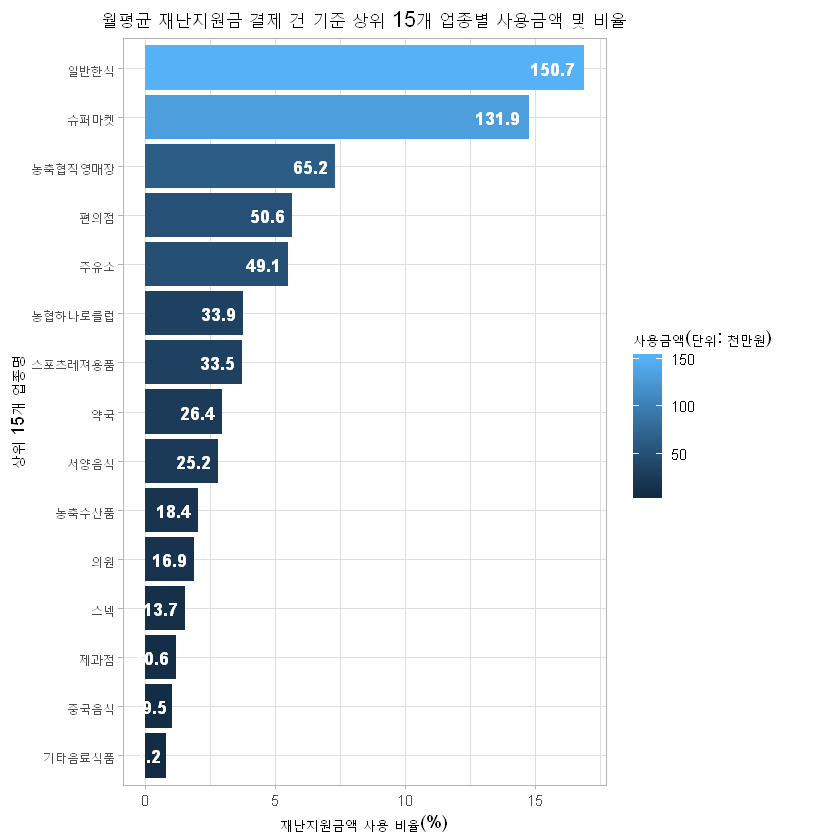

In [7]:
print(gg1)

## Insight 2.
월 평균 재난지원금 주요 사용업종을 묶어 확인해본 결과 일반 휴게음식, 유통업, 음료 식품, 연료 판매 등 일상생활에 밀접한 업종들에서 소비가 일어나는것을 확인할 수 있다.

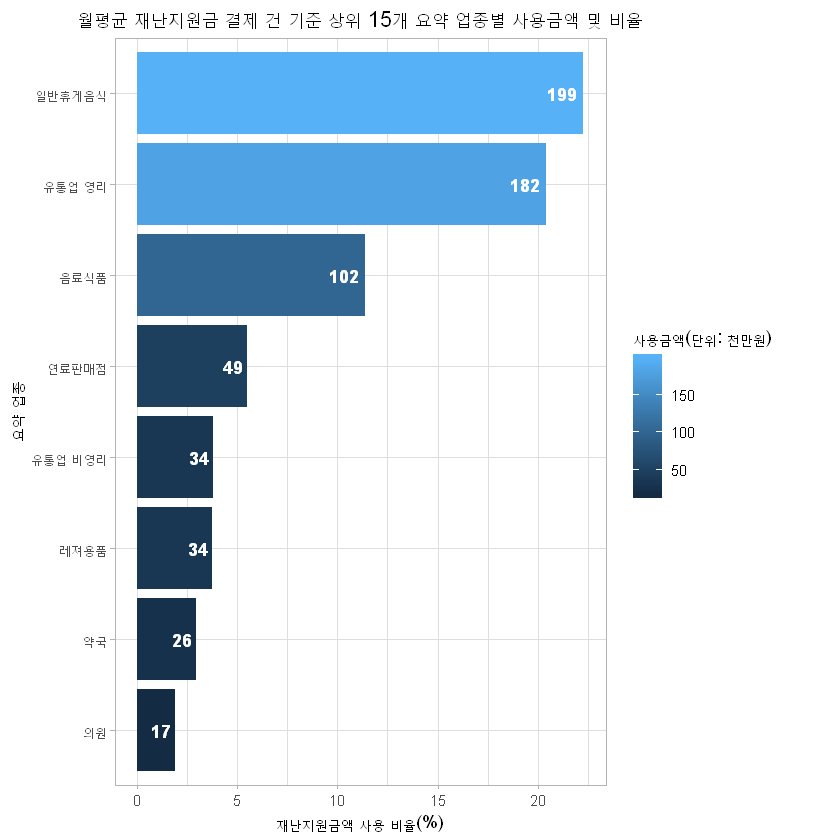

In [8]:
print(gg2)

In [9]:
# 2. 일반금액 많이 사용한 업종
type_norm = data_smry_by_mon %>% arrange(desc(total_spent)) %>% head(n = top) 
type_norm_nm = type_norm %>% pull(Type)
type_norm_upper = type_norm %>% pull(Type_Upper) %>% unique

type_norm_select = type_norm %>%
  dplyr::select(Type_Upper, Type, total_spent, total_cnt, total_rt) %>%
  arrange(desc(total_rt)) %>%
  mutate(spent = round(total_spent / 100000000, 1), 
         label = paste0(spent) ) #단위 억원

gg3 = ggplot(data = type_norm_select,
             aes(x =reorder(Type, total_rt), y = total_rt, fill = spent)) +
  geom_bar( stat = "identity" ) + coord_flip() +
  geom_text(aes(label=label), hjust = 1.2, color = "white", fontface = "bold" ) +
  labs(fill = "사용금액(단위: 억원)") +
  theme_light() + 
  ylab("재난지원금액 사용 비율(%)") +
  xlab("상위 15개 업종") +
  ggtitle("월평균 매출 상위 15개 업종의 사용금액 및 비율") +
  theme(plot.title = element_text(hjust = 0.5))

type_upper_nrom_select = type_norm %>%
  group_by(Type_Upper) %>%
  dplyr::summarise(total_spent = sum(total_spent),
                   total_cnt = sum(total_cnt),
                   total_rt = sum(total_rt)) %>%
  arrange(desc(total_rt)) %>%
  mutate(spent = round(total_spent / 100000000, 1), 
         label = paste0(spent) ) #단위 억원

gg4 = ggplot(data = type_upper_nrom_select,
             aes(x =reorder(Type_Upper, total_rt), y = total_rt, fill = spent)) +
  geom_bar( stat = "identity" ) + coord_flip() +
  geom_text(aes(label=label), hjust = 1.2, color = "white", fontface = "bold" ) +
  labs(fill = "사용금액(단위: 억원)") +
  theme_light() + 
  ylab("재난지원금액 사용 비율(%)") +
  xlab("요약 업종") +
  ggtitle("월평균 매출 상위 15개 업종의 사용금액 및 비율") +
  theme(plot.title = element_text(hjust = 0.5))

## Insight 3.
총 매출 기준으로 확인해본 결과 재난지원금과 유사하게 생활밀착형 업종에서 사용되는것을 확인할 수 있다.
하지만, '면세점', '유아원', '대형할인점' 등 재난지원금 활용이 어렵지만 소비가 활발한 업종에서도 소비가 발생하는 특징이 존재한다.

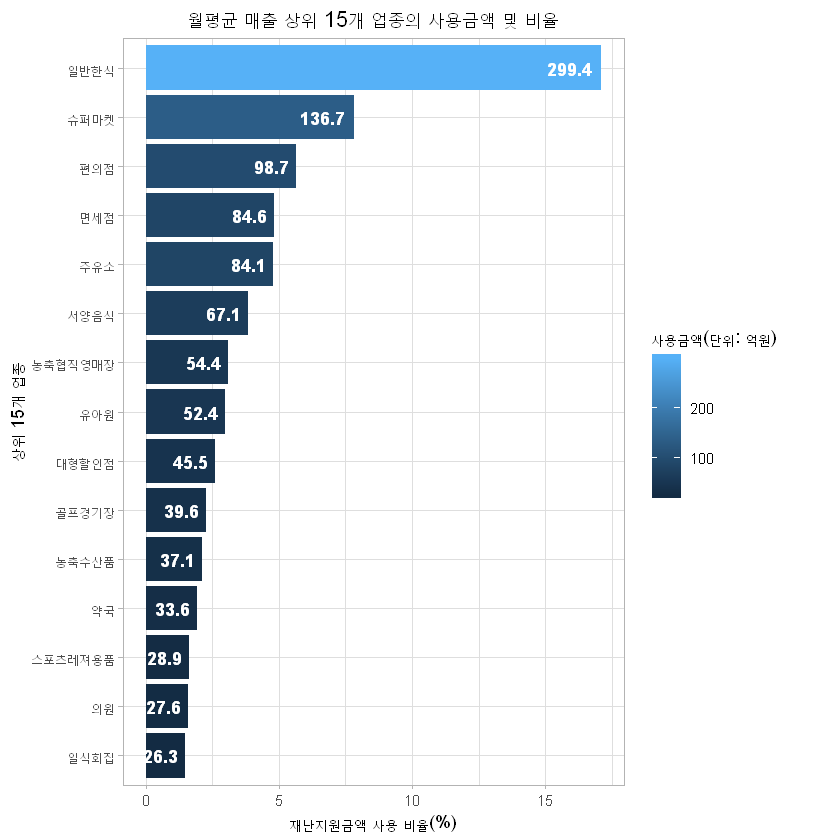

In [10]:
print(gg3)

## Insight 4.
업종을 요약하여 확인해봤을때는 재난지원금의 소비 패턴과 유사하게 생활 밀착형 업종에서 소비가 활발하다. 유통업 등 대분류 업종으로 집계하여 거시적인 변화가 없었기 때문이다.

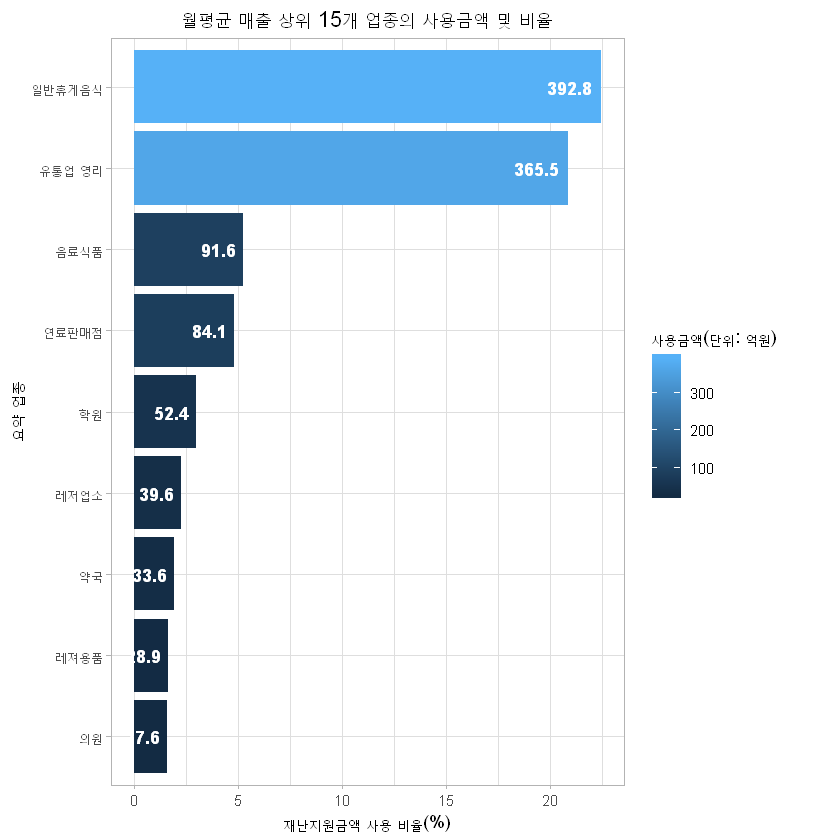

In [11]:
print(gg4)


# 1-3. 영세규모별 업종별 재난지원금 사용 비교

국세청에서 나눈 영세규모는 연간 매출로 그 기준은 아래와 같다.

- 영세:	3억원 이하

- 중소1:	3억원 초과 ~ 5억원 이하

- 중소2:	5억원 초과 ~ 10억원 이하

- 중소3:	10억원 초과 ~ 30억원 이하

- 일반:	30억원 초과


In [12]:
data_clss_smry = data_filter %>%
  group_by(YM, FranClass, Type) %>% 
  dplyr::summarise(
    TotalSpent = sum(as.numeric(TotalSpent), na.rm = TRUE),
    NumofSpent = sum(as.numeric(NumofSpent), na.rm = TRUE),
    DisSpent = sum(as.numeric(DisSpent), na.rm = TRUE),
    NumofDisSpent = sum(as.numeric(NumofDisSpent), na.rm = TRUE)
  )

data_clss_smry_by_mon = data_clss_smry %>%
  group_by(FranClass, Type) %>% 
  dplyr::summarise(
    total_spent = mean(TotalSpent), total_cnt = mean(NumofSpent),
    total_disspent = mean(DisSpent), total_discnt = mean(NumofDisSpent)
  ) %>%
  ungroup %>% mutate(
    total_rt = round(total_spent / sum(total_spent), 4) * 100,
    dis_rt = round(total_disspent / sum(total_disspent), 4) * 100 )

clss = unique(data_clss_smry_by_mon$FranClass)
top_cl = 10

cl_df = data.frame(clss = clss, clss_nm = c("매출 <=3억", "매출 > 30억",
                                         "매출 10억 ~ 30억", "매출 3억 ~ 5억",
                                         "매출 5억 ~ 10억" ) )

clss_plt = lapply(1:length(clss), function(i) {
  cl = clss[i]
  typ = cl_df[cl_df$clss == cl,]$clss_nm
  
  cl_data = data_clss_smry_by_mon %>% 
    dplyr::filter(FranClass == cl) %>%
    arrange(desc(total_disspent)) %>% head(n = top_cl) 
  
  cl_gg_data = cl_data %>%
    dplyr::select(Type, total_disspent, total_discnt, dis_rt) %>%
    arrange(desc(dis_rt)) %>%
    mutate(spent = round(total_disspent / 10000000, 1), 
           label = paste0(spent) ) #단위 천만원
  
  g = ggplot(data = cl_gg_data,
         aes(x =reorder(Type, dis_rt), y = dis_rt, fill = spent)) +
    geom_bar( stat = "identity" ) + coord_flip() +
    geom_text(aes(label=label), hjust = 1, color = "white", fontface = "bold" ) +
    labs(fill = "사용금액(단위: 천만원)") +
    theme_light() + 
    ylab("재난지원금액 사용 비율") +
    xlab( paste0("상위 ", top_cl, "개 업종") )+
    ggtitle( paste0(cl, "(", typ, ")") ) +
    theme(plot.title = element_text(hjust = 0.5))
  
  return(g)
})

## Insight 5.
영세한 규모일수록, 한식, 슈퍼마켓 등 생활 밀착형 업종에서 소비가 많이 발생한다.
규모가 클수록 병원, 대형할인점, 주유소 등 에서 소비가 발생한다.

규모에 차이에 관계 없이 생활 밀착형 업종에서 소비가 활발하다고 할 수 있다.

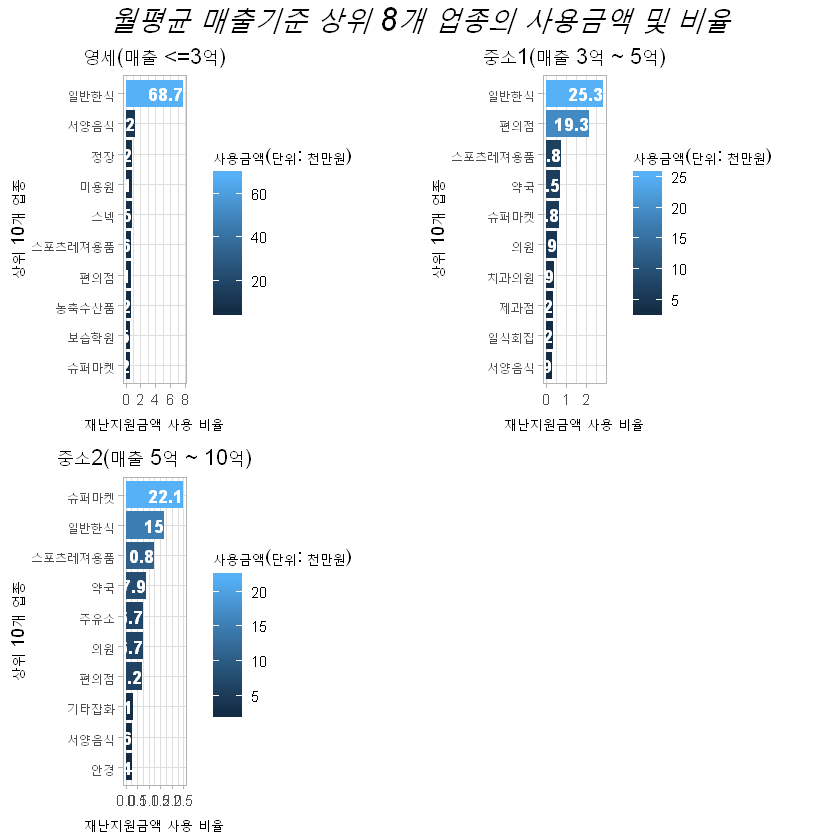

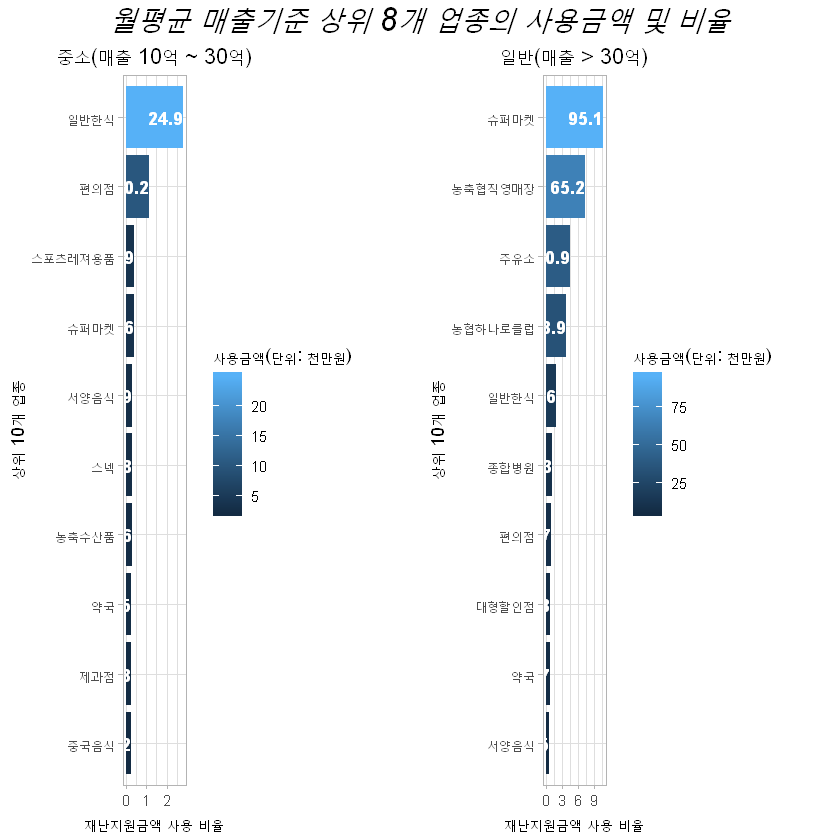

In [13]:
gg5 = grid.arrange(clss_plt[[1]], clss_plt[[4]], clss_plt[[5]],
             nrow=2, ncol=2,
             top = textGrob("월평균 매출기준 상위 8개 업종의 사용금액 및 비율",
                            gp=gpar(fontsize=20,font=3)) )

gg6 = grid.arrange(clss_plt[[3]], clss_plt[[2]], nrow=1, ncol=2,
                   top = textGrob("월평균 매출기준 상위 8개 업종의 사용금액 및 비율",
                                  gp=gpar(fontsize=20,font=3)) )

### 영세규모별 업종별 매출 상세 확인

[1] "영세 확인"


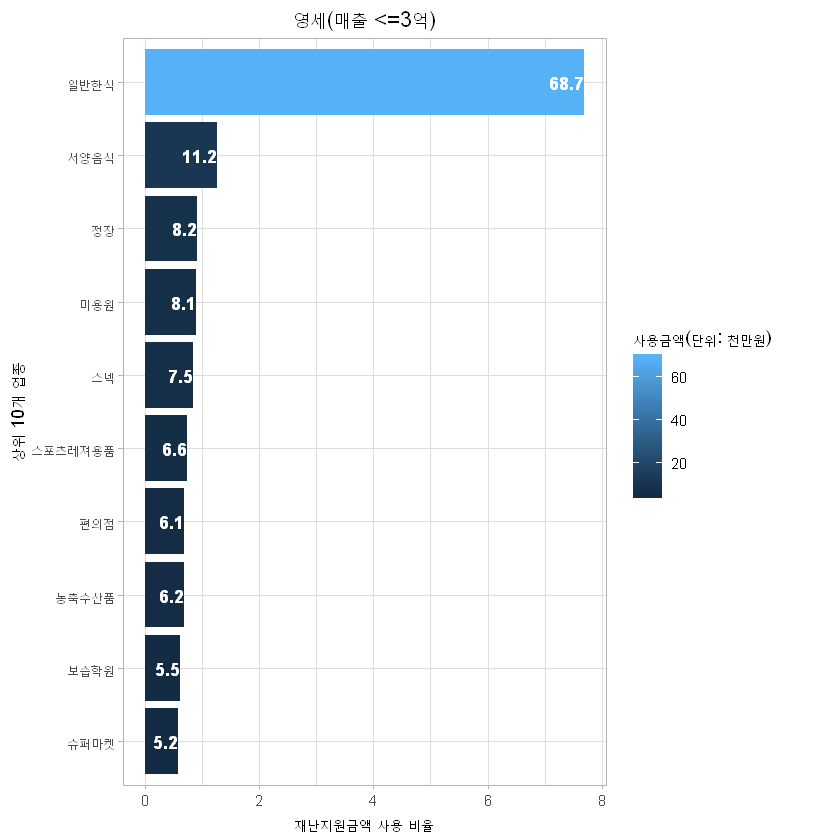

In [16]:
print("영세 확인")
clss_plt[[1]]

[1] "중소1 확인"


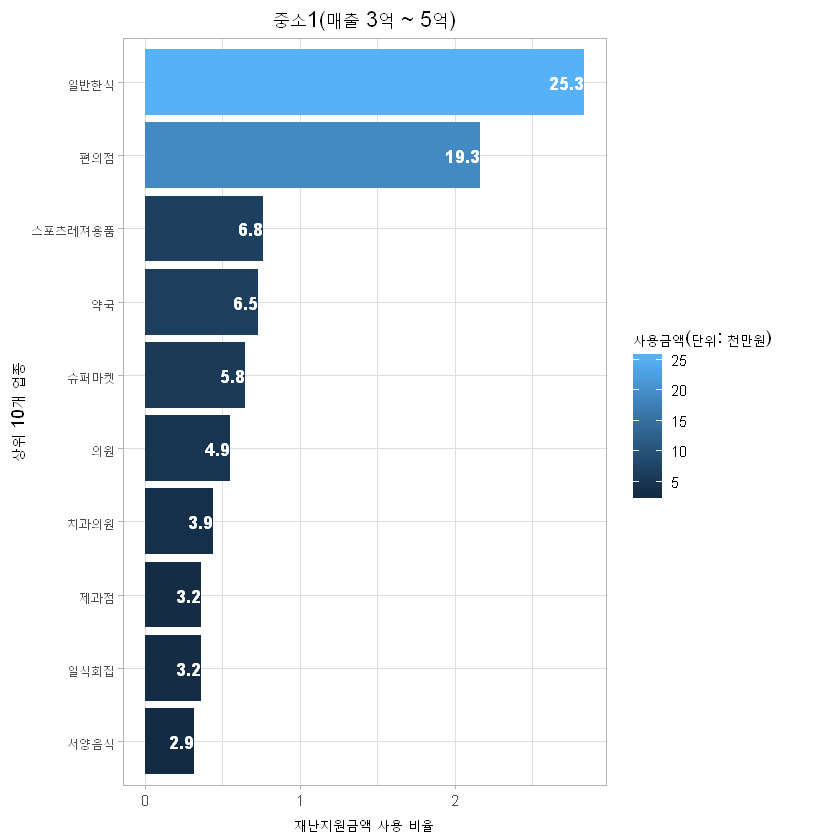

In [17]:
print("중소1 확인")
clss_plt[[4]]

[1] "중소2 확인"


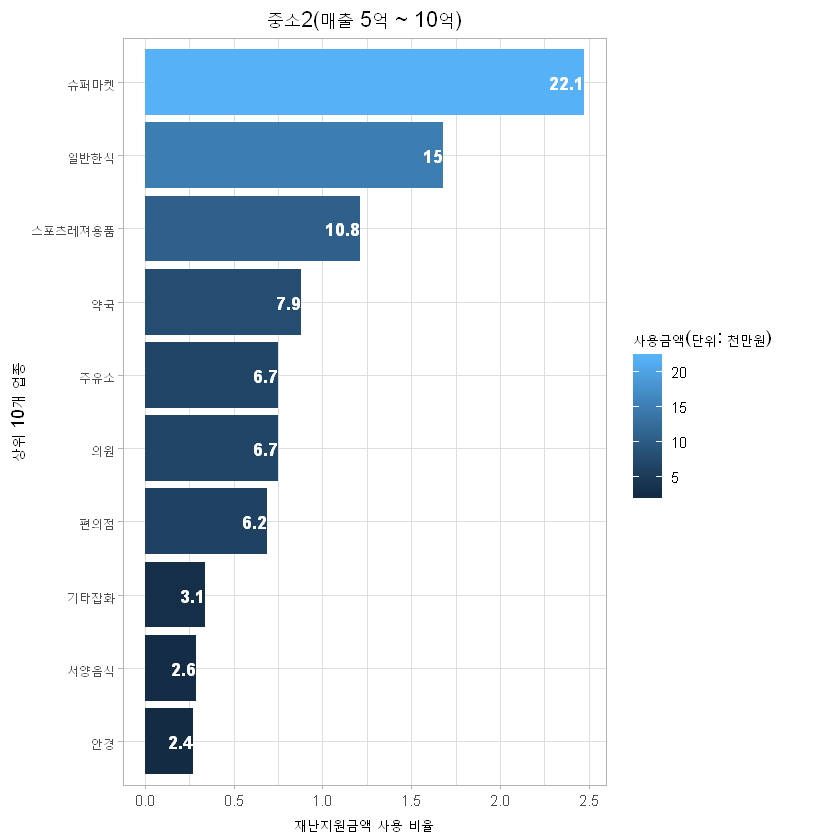

In [19]:
print("중소2 확인")
clss_plt[[5]]

[1] "중소 확인"


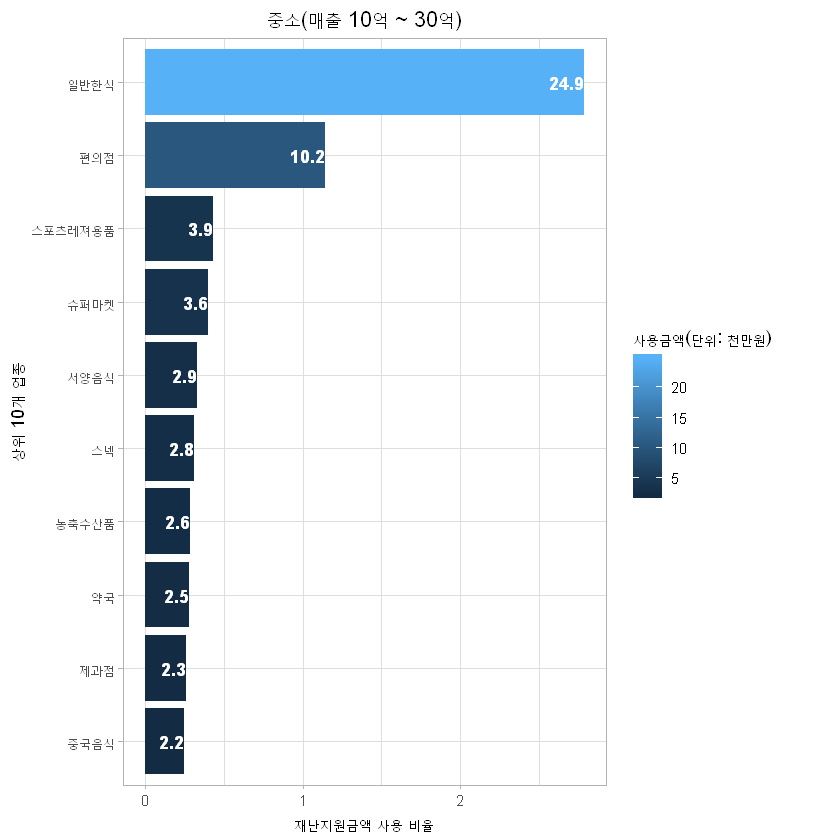

In [22]:
print("중소 확인")
clss_plt[[3]]

[1] "일반 확인"


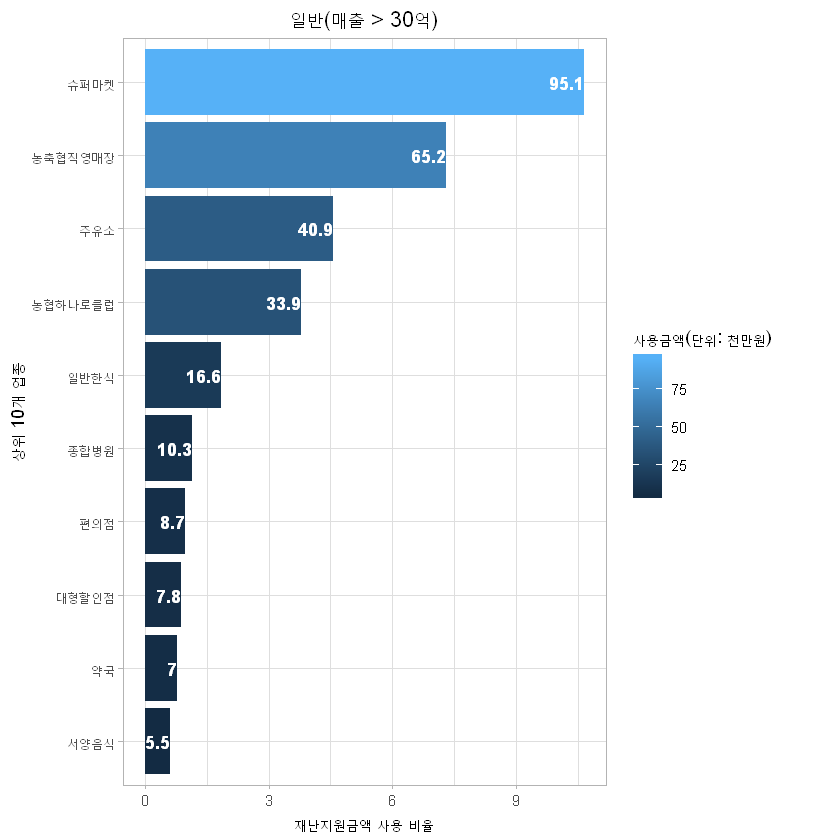

In [23]:
print("일반 확인")
clss_plt[[2]]

# 2. 시간에 따른 흐름 확인

In [24]:
data_total_smry = data_filter %>%
  group_by(YM) %>% 
  dplyr::summarise(
    TotalSpent = sum(as.numeric(TotalSpent), na.rm = TRUE),
    NumofSpent = sum(as.numeric(NumofSpent), na.rm = TRUE),
    DisSpent = sum(as.numeric(DisSpent), na.rm = TRUE),
    NumofDisSpent = sum(as.numeric(NumofDisSpent), na.rm = TRUE)
) %>% mutate(총결제금액 = TotalSpent/NumofSpent, 재난지원금액 = DisSpent/NumofDisSpent) %>%
  ungroup %>% dplyr::select(YM, 총결제금액, 재난지원금액) %>%
  as.data.table %>%
  melt(id = "YM")

In [25]:
# 건당가로 표기
gg7 = ggplot(data = data_total_smry,
       aes(x= YM, y = value, group = variable, color = variable)) +
  geom_line(stat='identity') +
  labs(color = "구분") +
  theme_light() + 
  ylab("건당가(결제금액/결제건수)") +
  xlab( "월" )+
  ggtitle( "월별 결제당 거래금액 평균의 추이 (20.05 ~ 20.08)" ) +
  theme(plot.title = element_text(hjust = 0.5))

## Insight 6.
코로나의 여파로 2020.05 ~ 2020.07 에 전반적 소비가 감소하였음을 확인할 수 있다.
또한, 1차 재난지원금 지원 직후인 5월 재난지원금 소비가 가장 컸으며, 점차 감소하다 8월부터 반등함을 확인할 수 있다.
2차 재난지원금은 8월 24일부터 접수했고, 추가 지원이 예정됐기 때문에 해당 그래프의 재난지원금액(파란선)은 올라갈것이라고 기대할 수 있다.

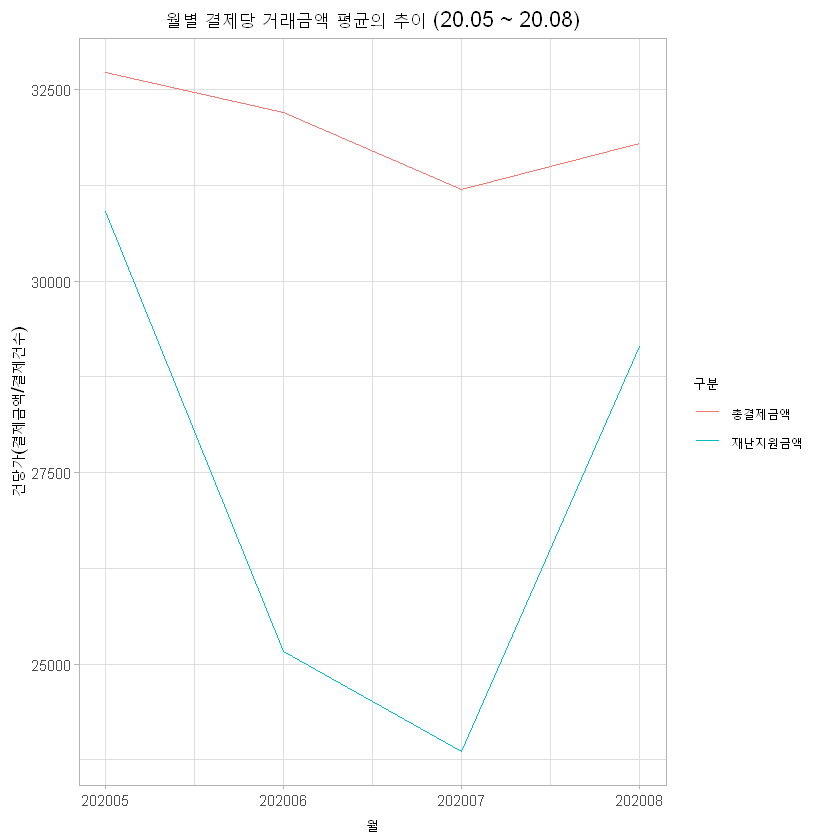

In [26]:
gg7

# 3. 시간대별 재난지원금 활용 현황

- 월별로 어떤 시간대에 주로 재난지원금을 활용했는지 확인

In [37]:
data_time_smry = data_filter %>%
  dplyr::filter(Time != "x시") %>% 
  group_by(YM, Time) %>% 
  dplyr::summarise(
    total_disspent = mean(as.numeric(DisSpent), na.rm = TRUE),
    total_discnt = mean(as.numeric(NumofDisSpent), na.rm = TRUE),
    재난지원금_거래금액 = sum(as.numeric(DisSpent), na.rm = TRUE),
    재난지원금_거래건수 = sum(as.numeric(NumofDisSpent), na.rm = TRUE)
  ) %>%
  mutate(
    #재난지원금_건당가 = total_disspent / total_discnt,
    재난지원금_거래건수_상대조정 = (재난지원금_거래건수 - mean(재난지원금_거래건수)) / sd(재난지원금_거래건수)
  )
data_time_smry$ym = as.factor(data_time_smry$YM)
data_time_smry$time = as.factor(as.numeric(gsub("x", "99", gsub("시", "", data_time_smry$Time))))

# 재난지원금 시간대별 평균 건당가
gg8 = ggplot(data_time_smry,aes(x=ym,y=time))+
  geom_tile(aes(fill=재난지원금_거래건수_상대조정)) +
  scale_fill_gradient(low="#ffffb3", high="#EA4510")+
  theme_bw(base_size=10)

## Insight 7.
월별로 시간대별 평균 거래 건수를 분석해본 결과 주로 오후 시간대 (10시 ~ 21시)에 거래가 활발합니다.
(아래의 표는 거래건수를 상대조정[정규화]하였는데 이는 한 표에 동일한 범주로 표현하기 위함입니다.
특히 오후 12시와 18시에 소비가 활발하게 일어납니다.

이 외에 오전 및 저녁시간대에는 소비가 매우 적으며 일상 시간대에 재난지원금이 많이 사용되는데 이는 재난 지원금이 생활 밀착형 업종에서 주로 사용되는 특징이 있기 때문으로 보입니다.

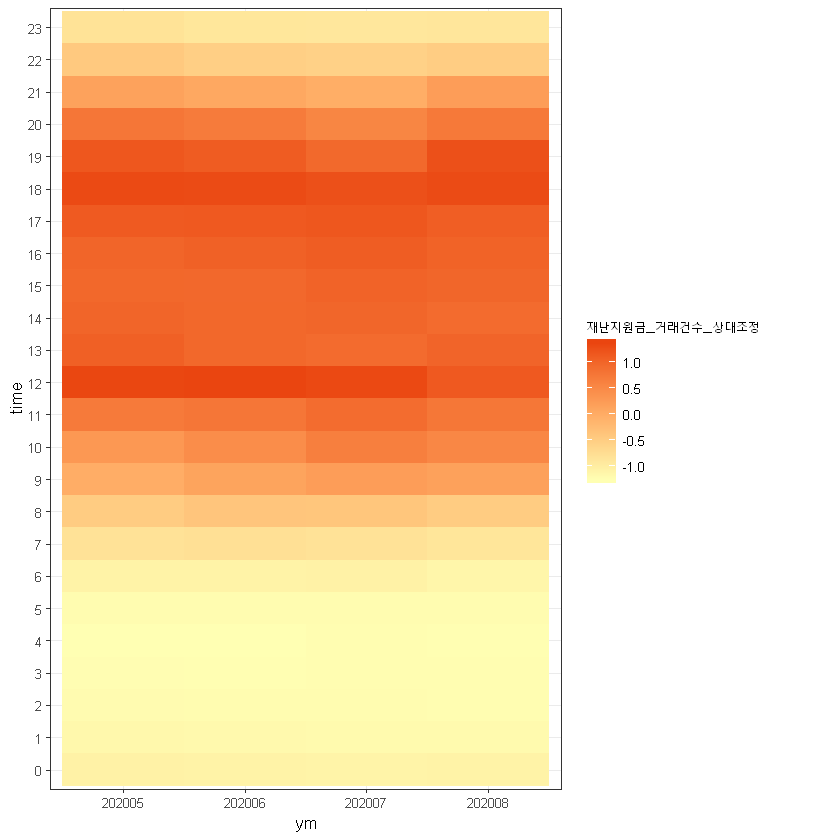

In [38]:
gg8

# 4. 재난지원금이 사용된 업체들의 밀집지역 확인

1. DBSCAN 알고리즘 기반 재난지원금 사용 업체의 15개 이상 업체가 모인 군집지역을 도출하고
2. Convex_hull알고리즘을 활용해 업체들을 영역화하여 지도에 표현

In [39]:
data_dis = data_filter %>% mutate(key = 1:nrow(.)) %>%
            dplyr::filter(DisSpent > 0)

data_ptr = data_dis %>% dplyr::select(POINT_X, POINT_Y) %>% unique
# 거리 기준 300m, 최소 그룹 기준 4로 그룹핑
# EPSG 5179는 유클리드 거리 활용시 meter단위로 환산됨
data_grp = dbscan(data_ptr, eps = 250, MinPts = 15)

data_ptr$grp = data_grp$cluster
data_ptr_sf = data_ptr %>% st_as_sf(coords = c("POINT_X", "POINT_Y"), crs = 5179 )

# 대표 그룹 도출 [15곳 이상 군집된 지역] 및 시각화
#grp_idx = as.numeric(which(table(data_ptr$grp) > 100))
unq_grp = unique(data_grp$cluster)
unq_grp = unq_grp[unq_grp>0]
#x = lapply(1:length(unq_grp), function(i) {
convex_hull = lapply(1:length(unq_grp), function(i) {
  grp = unq_grp[i]
  x = data_ptr_sf[data_ptr_sf$grp == grp,]
  
  res = st_convex_hull(st_union(x)) %>% st_transform(crs = 4326)
  
  return(res)
})

bas_select = bas
bas_wgs = bas_select %>% st_transform(crs = 4326)
center_xy = bas_wgs %>% st_centroid %>% st_coordinates %>% apply(., 2, mean)
vx = as.numeric(center_xy[1])
vy = as.numeric(center_xy[2])
zoom = 10

l = leaflet() %>% addTiles() %>%
  setView( vx, vy, zoom )
for(i in 1:length(convex_hull)) {
  l = l %>%
    addPolygons(data = convex_hull[[i]])
}

print("leaflet 지도 출력;")
l

print("지도 미 출력의 대비해 캡쳐 이미지 첨부")

[1] "leaflet 지도 출력;"


HTML widgets cannot be represented in plain text (need html)

[1] "지도 미 출력의 대비해 캡쳐 이미지 첨부"


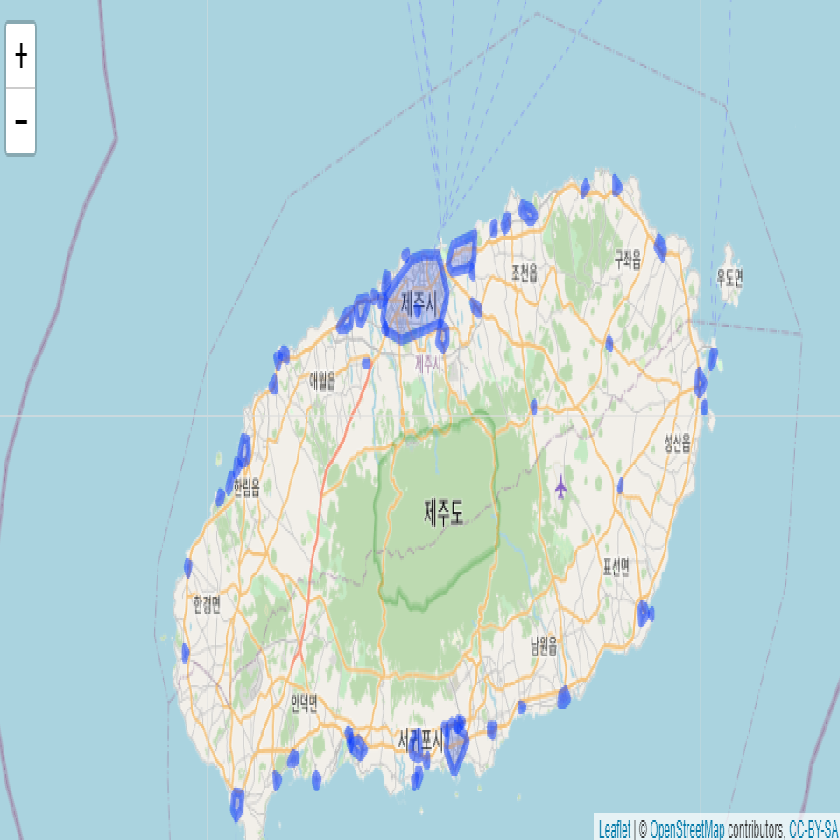

In [40]:
img = "../result/제주도_재난지원금_군집.png"
ggbackground(ggplot(), img)

## Insight 8.
제주도 제주시, 서귀포시 뿐만 아니라 해변 인근 관광지에 재난지원금이 사용된 업체들이 밀집해있음을 확인할 수 있다.

# 월별, 국가 기초구역별 재난지원금 사용 분포

- 국가 기초구역 기준으로 재난지원금 POINT 정보를 매칭시킴.
- 재난지원금 사용금액을 기준으로 Natural breaks를 8단계로 생성하여 구간을 생성.
- 이를 지도에 표현.

In [41]:
# 우편번호별 상권 생성
data_sf = data_dis %>%
  st_as_sf(coords = c("POINT_X", "POINT_Y"), crs = 5179)
data2bas = st_join(data_sf, bas_select)
data2bas_select = data2bas %>% as.data.table %>% dplyr::select(-geometry)
data2bas_smry = data2bas_select %>% group_by(BAS_ID, YM) %>%
  dplyr::summarise(
    DisSpent = sum(as.numeric(DisSpent), na.rm = TRUE),
    NumofDisSpent = sum(as.numeric(NumofDisSpent), na.rm = TRUE),
    shop_cnt = n() 
  )

grp = 8
natural_breaks_by_ym = data2bas_smry %>% group_by(YM) %>%
  dplyr::do( as.data.frame(getJenksBreaks(.$DisSpent,k = grp)) )
names(natural_breaks_by_ym) = c("YM", "val")
natural_breaks_by_ym = as.data.table(natural_breaks_by_ym)
natural_breaks_by_ym[val == 0, val:= -1]

# natural break별 컬러 생성
map_pallete = c("#f7ebe9","#f5c7bc","#f7b7a8","#f7a592","#f08369","#f25935","#f03105")
pallet_df = data.frame(cut = c(1:length(map_pallete)), color = map_pallete)

yms = unique(natural_breaks_by_ym$YM)

leaflet_res = lapply(1:length(yms), function(i) {
    ym = yms[i]
    target_natural_breaks = natural_breaks_by_ym[natural_breaks_by_ym$YM == ym,]    
    target_smry = data2bas_smry[data2bas_smry$YM == ym,]

    target_smry$cut = as.numeric(cut(target_smry$DisSpent,
                                 target_natural_breaks$val,
                                 labels = c(1:(grp-1) ) ) )
    target_smry_join = target_smry %>%left_join(pallet_df, by = "cut")

    target_bas = merge(bas_select, target_smry_join, by = "BAS_ID", all = FALSE)
    target_bas = target_bas %>% st_transform(., crs = 4326)

    center_xy = target_bas %>% st_centroid %>% st_coordinates %>% apply(., 2, mean)
    vx = as.numeric(center_xy[1])
    vy = as.numeric(center_xy[2])
    zoom = 10

    bas_ids = target_bas$BAS_ID

    br_val = target_natural_breaks$val
    br_val = br_val[-length(br_val)]

    label_add = paste0(round(br_val/10000000,2),
                    " ~ ",
                    round(lead(br_val/10000000), 2))

    label_add[1] = gsub("0 ~ ", " <= ", label_add[1])
    label_add[length(label_add)] = gsub(" ~ NA", " >= ", label_add[length(label_add)])

    l_ym = leaflet() %>% addTiles() %>%
          addLegend("topright", 
              colors = map_pallete,
              labels= label_add,
              title= paste0(ym, " 재난지원금(단위: 천만원)" ),
              opacity = 1) %>%
    setView( vx, vy, zoom )

    for(bas_id in bas_ids) {
    bas_data = target_bas %>% dplyr::filter(BAS_ID == bas_id)

    l_ym = l_ym %>% addPolygons(data = bas_data,
                                fillOpacity = 0.5,
                                color = bas_data$color,
                                weight = 1)

    }
    
    return(l_ym)
})


## Insight 9.
Insight 8.에서 확인한 군집지역에서 재난지원금 소비가 활발히 발생함을 확인할 수 있다. 특히, 제주시 및 서귀포시의 시내에서 사용금액이 높은 점이 특징이다.

월별로 재난지원금 사용지역에 큰 차이는 없으나 시간이 흐름에 따라 제주도 한라산 인근의 국도 지역에서 소비가 늘었는데, 이는 여름 가까워짐에 따른 관광 인구 증대 효과로 유추해볼 수 있다.

In [42]:
print("2020년 5월 지도 출력")
leaflet_res[[1]]

[1] "2020년 5월 지도 출력"


HTML widgets cannot be represented in plain text (need html)

In [45]:
print("2020년 8월 지도 출력")
leaflet_res[[4]]

[1] "2020년 6월 지도 출력"


HTML widgets cannot be represented in plain text (need html)

[1] "지도가 출력되지 않음을 확인하고 캡쳐 이미지로 갈음"


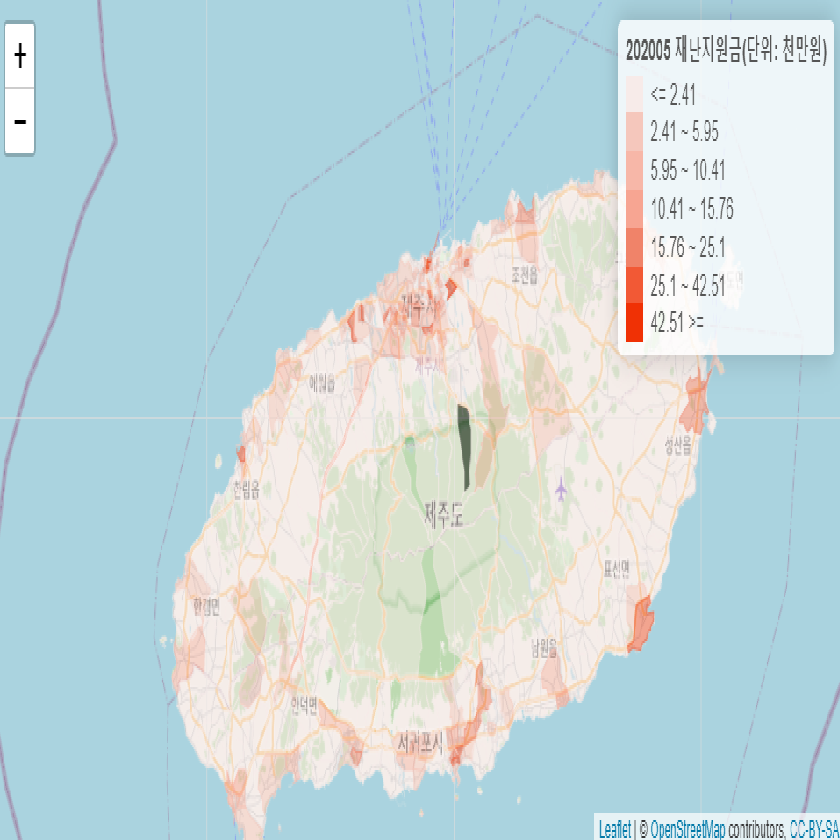

In [7]:
print("지도가 출력되지 않음을 확인하고 캡쳐 이미지로 갈음")
img = "../result/제주도_재난지원금_소비.png"

print("2020년 5월 지도 출력")
ggbackground(ggplot(), img)

[1] "2020년 8월 지도 출력"


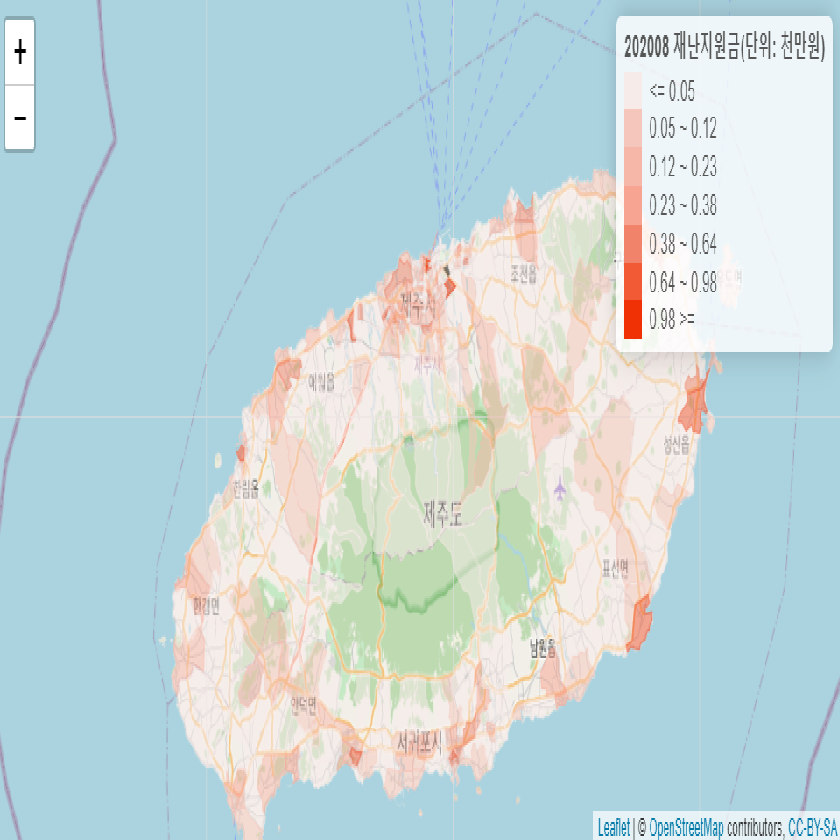

In [46]:
img = "../result/8월.png"

print("2020년 8월 지도 출력")
ggbackground(ggplot(), img)

# 재난지원금 사용을 통한 전통시장 활성화유무 확인

- 국가 기초구역 기준으로 재난지원금 POINT 정보를 매칭시킴.
- 재난지원금 사용금액을 기준으로 Natural breaks를 8단계로 생성하여 구간을 생성.
- 이를 지도에 표현.

In [47]:
# 제주도 전통시장 위치 및 주소
jeju_market_ptr

nm,addr,magnitude,area,shop_cnt,x,y
고성오일시장,제주특별자치도 서귀포시 성산읍 고성오조로 93,4,7113,74,126.9128,33.45186
대정오일시장,제주특별자치도 서귀포시 대정읍 신영로36번길 65,3,17714,279,126.2482,33.22061
모슬포중앙시장,제주특별자치도 서귀포시 대정읍 상모로 327,4,3300,77,126.2545,33.22207
서귀포매일올레시장,제주특별자치도 서귀포시 중앙로 62번길 18,3,11468,188,126.5632,33.25015
서귀포향토오일시장,제주특별자치도 서귀포시 토평서로11번길 142,2,42900,582,126.5737,33.26779
성산오일시장,제주특별자치도 서귀포시 성산읍 성산중앙로 37번길 6,4,1665,6,126.9331,33.46382
중문오일시장,제주특별자치도 서귀포시 서귀포시 중문동 2123-1,4,6885,73,126.4242,33.25084
표선오일시장,제주특별자치도 서귀포시 표선면 표선리 1001-1,4,7917,62,126.8303,33.32234
도남시장,제주특별자치도 제주시 도남동 923의 13,4,3220,80,126.5289,33.49647
동문시장(주),제주특별자치도 제주시 동문로 16,4,2314,97,126.5283,33.51280


### 제주도 전통시장 위치 시각화

In [48]:
# buffer 150m + 넓이 기준 추가
jeju_market_sf = st_as_sf(jeju_market_ptr, coords = c("x", "y"), crs = 4326) %>%
                  st_transform(crs = 5179) %>% mutate(buffer_area = 150 + sqrt(area) / pi )

jeju_market_buffer = lapply(1:nrow(jeju_market_sf), function(i) {
  md = jeju_market_sf[i,]
  buf = st_buffer(md, dist = md$buffer_area) %>% st_transform(., crs = 5179)
  return(buf)
}) %>% do.call(rbind, .)

# 전통시장 형상정보 확인
center_xy = bas_wgs %>% st_centroid %>% st_coordinates %>% apply(., 2, mean)
vx = as.numeric(center_xy[1])
vy = as.numeric(center_xy[2])
zoom = 10

jeju_market_map = leaflet() %>% addTiles() %>%
  setView( vx, vy, zoom )
for(i in 1:nrow(jeju_market_buffer)) {
  jeju_market_buffer_tmp = jeju_market_buffer[i,] %>% st_transform(., crs = 4326)
  jeju_market_map = jeju_market_map %>%
              addPolygons(data = jeju_market_buffer_tmp)
}
jeju_market_map

HTML widgets cannot be represented in plain text (need html)

[1] "지도가 출력되지 않음을 확인하고 캡쳐 이미지로 갈음"


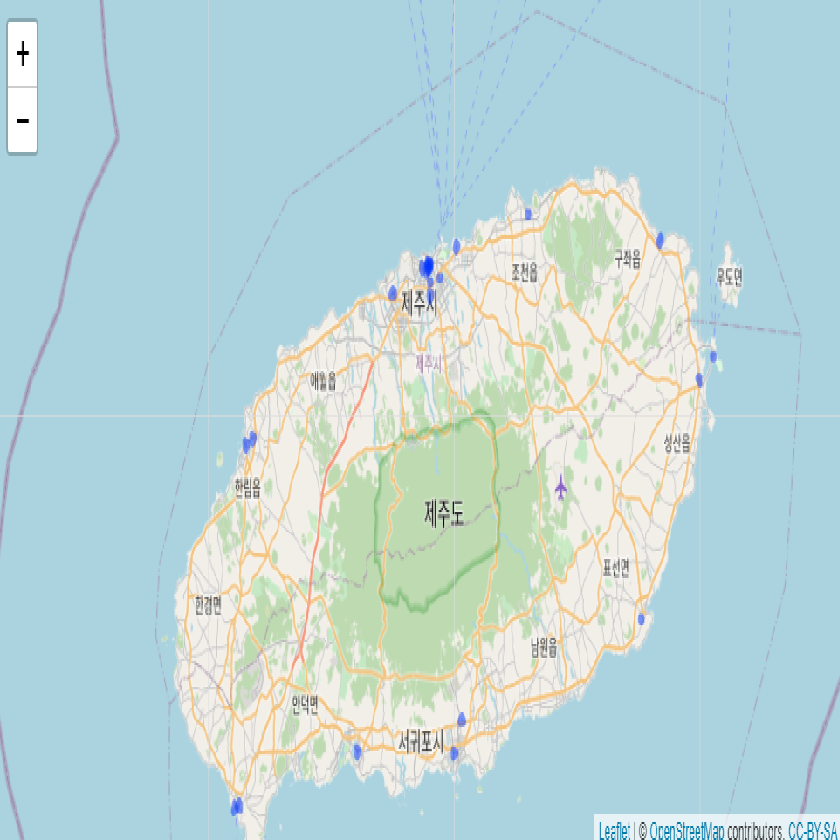

In [49]:
print("지도가 출력되지 않음을 확인하고 캡쳐 이미지로 갈음")
img = "../result/제주도_전통시장.png"
ggbackground(ggplot(), img)

In [50]:
# 전통시장 매출 추이 확인
# 전통시장 - 매장 매칭
data_market_ptr = data_filter %>% mutate(key = 1:nrow(.)) %>% 
              dplyr::select(POINT_X, POINT_Y) %>% unique
data_market_ptr_sf = data_market_ptr %>% 
                      st_as_sf( coords = c("POINT_X", "POINT_Y"), crs = 5179)

ptr2market = st_join(data_market_ptr_sf, jeju_market_buffer)
ptr2market = ptr2market[!is.na(ptr2market$nm),]

ptr_remain = ptr2market %>% st_coordinates %>% as.data.table
names(ptr_remain) = c("POINT_X", "POINT_Y")

data_join = data_filter %>% inner_join(ptr_remain, by = c("POINT_X", "POINT_Y"))

# 전통시장 월별 재난지원금 vs 전체 추이
data_join_smry = data_join %>% group_by(YM) %>%
  dplyr::summarise(
    재난지원금_사용금액 = sum(as.numeric(DisSpent), na.rm = TRUE),
    재난지원금_사용건수 = sum(as.numeric(NumofDisSpent), na.rm = TRUE),
  ) %>% mutate(재난지원금_사용금액 = round(재난지원금_사용금액/10000000, 2),
                         재난지원금_사용건수 = round(재난지원금_사용건수/ 1000, 2) ) # 천만원

gg_data1 = melt(as.data.table(data_join_smry), id = "YM")

# 전체 소비 대비 전통시장 내 소비 비율 확인
data_filter_smry = data_filter %>% group_by(YM) %>%
  dplyr::summarise(
    전체_재난지원금_사용금액 = sum(as.numeric(DisSpent), na.rm = TRUE),
    전체_재난지원금_사용건수 = sum(as.numeric(NumofDisSpent), na.rm = TRUE)
  ) %>% mutate(전체_재난지원금_사용금액 = round(전체_재난지원금_사용금액/10000000, 2),
                            전체_재난지원금_사용건수 = round(전체_재난지원금_사용건수/ 1000, 2) )

gg_data = data_join_smry %>% left_join(data_filter_smry, by = "YM")
gg_data$재난지원금_사용금액_비율 = round(gg_data$재난지원금_사용금액 / gg_data$전체_재난지원금_사용금액, 4) *100
gg_data$재난지원금_사용건수_비율 = round(gg_data$재난지원금_사용건수 / gg_data$전체_재난지원금_사용건수, 4) * 100
gg_data2 = gg_data %>% dplyr::select(YM, 재난지원금_사용금액_비율, 재난지원금_사용건수_비율)

gg_data2 = melt(as.data.table(gg_data2), id = "YM")  

In [51]:
# 전통시장에서 사용금액과 건수는 떨어짐.
gg99 = ggplot(data = gg_data1,
       aes(x= YM, y = value, group = variable, color = variable) ) +
  geom_line(stat='identity') +
  scale_y_continuous(name="사용금액(단위: 천만원)",
                     sec.axis = sec_axis(~ (1/3)*., name="사용건수")) +
  labs(color = "") +
  theme(legend.position = "bottom") +
  ggtitle( "전통시장의 월별 재난지원금 사용 추이" ) +
  theme(plot.title = element_text(hjust = 0.5))

# 전체 대비 비율은 증가함을 확인.
gg98 = ggplot(data = gg_data2,
              aes(x= YM, y = value, group = variable, color = variable) ) +
  geom_line(stat='identity') +
  scale_y_continuous(name="사용금액 비율",
                     sec.axis = sec_axis(~ (1/3)*., name="사용건수 비율")) +
  labs(color = "") +
  theme(legend.position = "bottom") +
  ggtitle( "전통시장의 월별 전체소비 대비 재난지원금 사용 추이" ) +
  theme(plot.title = element_text(hjust = 0.5))


## Insight 10.
전통시장에서 발생한 매출의 추이만을 확인하였다.
Insight 6.에서 확인한대로 전반적으로 소비는 감소하는 추세이나 눈에 띄는점은 오른쪽의 그래프처럼 '전체 제주도 소비 대비 전통시장 소비'를 비율로 확인했을때이다.
전통시장의 소비 비율은 당초 낮아졌으나, 재난지원금의 소비 비율이 늘어나고 있다는 점에서 재난지원금이 제주도 내 전통시장의 소비 증진에 도움을 줬음을 확인할 수 있다.

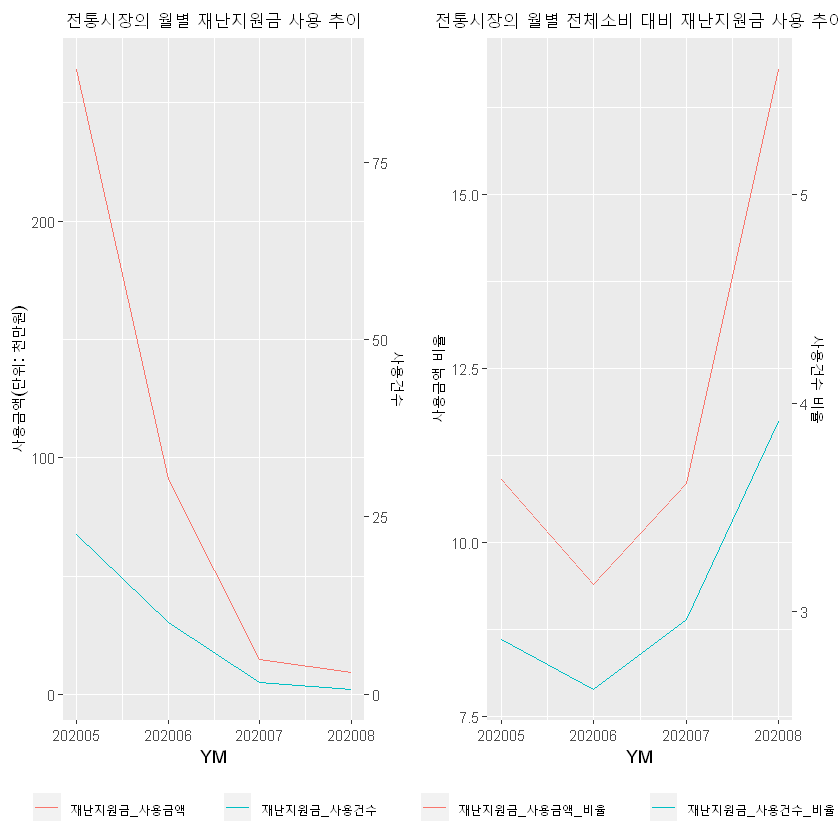

In [52]:
grid.arrange(gg99, gg98, nrow=1, ncol=2)